# M07 - Caracterización y Agrupación de Usuarios en Redes Sociales mediante Análisis de Mensajes

Grupo 3:

>- Juan Pablo Baudoin


# Similarities

In [1]:
import matplotlib.pyplot as plt
import matplotlib
import os

import numpy as np
import pandas as pd
import seaborn as sns
import emoji
import io
import chardet
from unidecode import unidecode
# from pycountry import languages
# from langid.langid import LanguageIdentifier, model

from lib.utils import *
from lib.sim import *

from pandarallel import pandarallel

pandarallel.initialize()
sns.set(rc={'figure.figsize':(10,6)})
pd.set_option('display.max_rows', 10) # cambiar el número de filas que se mostrarán usando display.max_rows.

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [2]:
# ! pip install nltk -q

In [3]:
base_name = "filtered_data_2"
sim_work_file = f"data/{base_name}_pre-processed.csv"
if os.path.exists(sim_work_file):
    print(f"File {sim_work_file} already exists. Loading it.")
    df_sim = pd.read_csv(sim_work_file)
    df_sim['date_source_posted_at'] = pd.to_datetime(df_sim['date_source_posted_at'])
else:

    raise Exception(f"File {sim_work_file} does not exist. Please run the previous notebook.")


File data/filtered_data_2_pre-processed.csv already exists. Loading it.


## Groups to analize

Para la comparación de mensajes es importante considerar que mensajes a comparar, hacer una comparación total no tiene mucho sentido dado que hay mensajes muy disimiles, por ejemplo un mensaje de 3 palabras frente a otro de 15. Tambien dado que tenemos datos que caracterizan a los mensajes podemos tomar esa información para armar grupos de comparación más relacionados. En este analisis vamos a revisar los mensajes por grupos que compartan **message_lbr**, **word_bin** y **trade_type**

In [4]:
def gen_groups(df_msg):
# def gen_groups(df, group_cols):
    df_grouped = None
    print("Grouping")
    # df_grouped = df_sim.groupby([group_cols], dropna=False)
    df_grouped = df_msg.groupby(['message_lbr', 'word_bin', 'trade_type'], dropna=False)
    # transform the groupby object to a DataFrame
    df_grouped = df_grouped.size().reset_index(name='count')


    # replace NA values in commodity  wiht {Not Specified}
    df_grouped['trade_type'] = df_grouped['trade_type'].fillna('{Not Specified}')

    # sort df_grouped by count
    df_grouped = df_grouped.sort_values(by='count', ascending=False)

    return df_grouped

df_grouped = gen_groups(df_sim)

# print df_grouped size
print(f"Number of rows in df_grouped: {df_grouped.shape[0]}")

grp_min_size = 10
flt = df_grouped['count'] > grp_min_size
df_grouped2 = df_grouped[flt]

print(f"Number of rows in df_grouped filter by size > {grp_min_size}: {df_grouped2.shape[0]}")


Grouping
Number of rows in df_grouped: 230
Number of rows in df_grouped filter by size > 10: 67


Se armaron un total de 230 grupos, si consideramos aquellos que tienen más de 10 mensajes nos quedamos con un conjuto de 67.

In [5]:
df_grouped2

,message_lbr,word_bin,trade_type,count
205,16,29,buy,1464
145,8,29,buy,1332
193,12,29,buy,1158
184,11,29,buy,783
175,11,19,buy,580
...,...,...,...,...
213,20,29,buy,13
15,0,29,buy,13
159,9,29,sell,12
21,1,22,sell,12


## List de Mensajes a comparar

Para determinar que mensajes vamos a comparar, vamos a procesarlos por una ventana de tiempo, en la que un mesaje se comparara con los otros de su grupo dentro de esa ventana. La ventana se define con el inicio del mensaje a comparar y un tamaño de ventana en días.

Por ejemplo si la ventana es de 7 días se compararia un mensaje con los que esten dentro de los siguientes 7 días a partir de la fecha del mensaje, esto dentro del grupo al que el mensaje pertenece.


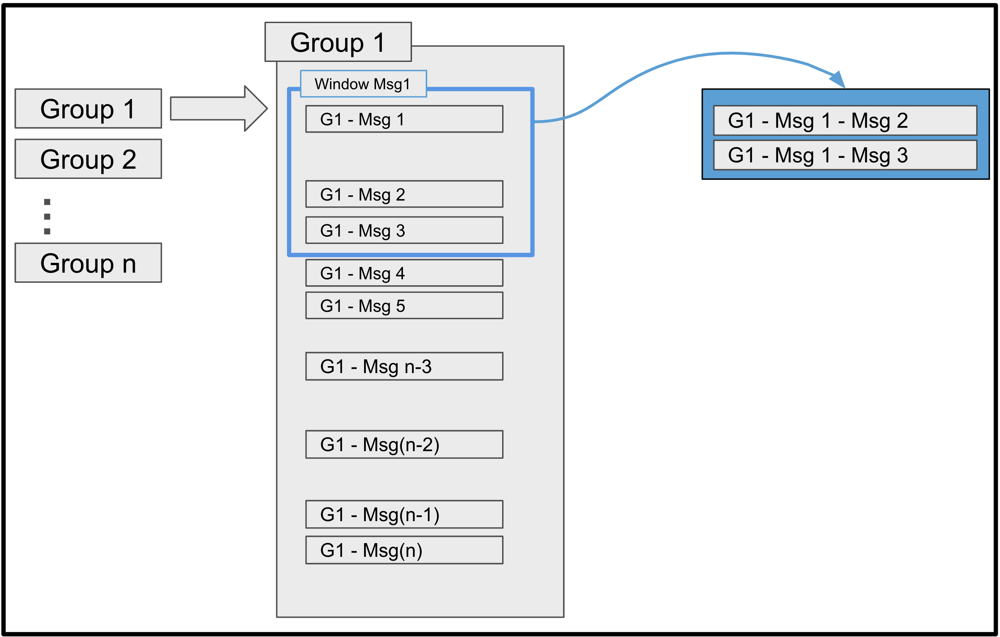

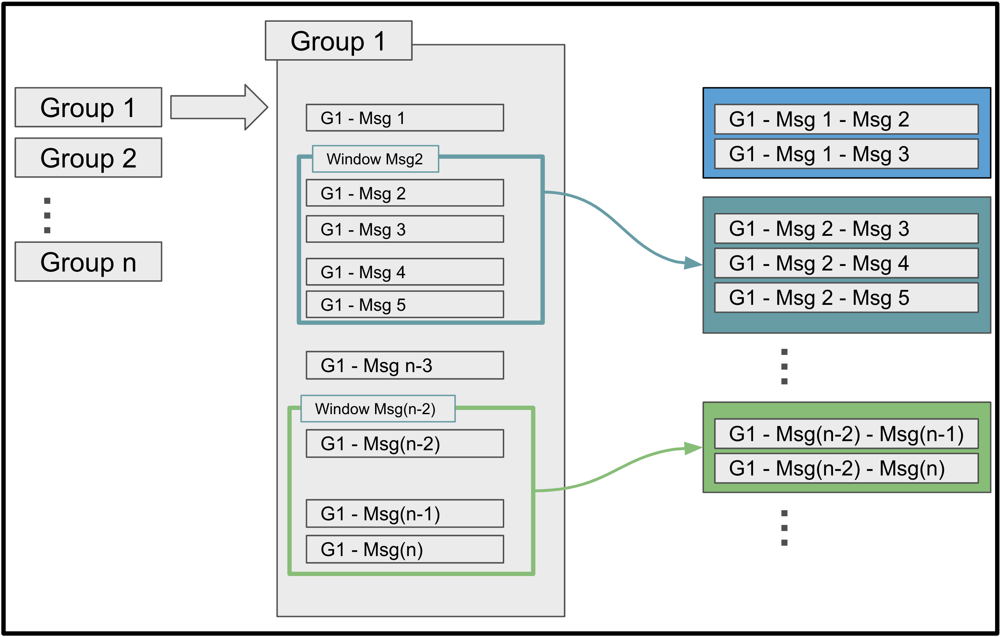

In [6]:
# Generate a comparison list
window_size = 7
df_results = build_compare_list(df_grouped2, window_size, df_sim)

df_results

message_lbr: 16, word_bin: 29, trade_type: buy, count: 1464
message_lbr: 8, word_bin: 29, trade_type: buy, count: 1332
message_lbr: 12, word_bin: 29, trade_type: buy, count: 1158
message_lbr: 11, word_bin: 29, trade_type: buy, count: 783
message_lbr: 11, word_bin: 19, trade_type: buy, count: 580
message_lbr: 14, word_bin: 29, trade_type: buy, count: 533
message_lbr: 7, word_bin: 29, trade_type: buy, count: 495
message_lbr: 10, word_bin: 29, trade_type: buy, count: 453
###########
    lbr: 10
    word_bin: 29
    trade_type: buy
-----
{'message_lbr': 10, 'word_bin': 29, 'trade_type': 'buy', 'id_1': 12058, 'id_2': 8923, 'date_id_1': Timestamp('2022-10-14 02:11:18+0000', tz='UTC'), 'date_id_2': Timestamp('2022-10-14 05:53:52+0000', tz='UTC')}
###########
###########
    lbr: 10
    word_bin: 29
    trade_type: buy
-----
{'message_lbr': 10, 'word_bin': 29, 'trade_type': 'buy', 'id_1': 12058, 'id_2': 9471, 'date_id_1': Timestamp('2022-10-14 02:11:18+0000', tz='UTC'), 'date_id_2': Timestamp(

,message_lbr,word_bin,trade_type,id_1,id_2,date_id_1,date_id_2
0,16,29,buy,9739,9488,2022-02-13 07:51:09+00:00,2022-02-18 17:37:22+00:00
1,16,29,buy,980,9488,2022-02-14 14:08:01+00:00,2022-02-18 17:37:22+00:00
2,16,29,buy,9830,9488,2022-02-14 17:56:40+00:00,2022-02-18 17:37:22+00:00
3,16,29,buy,812,9488,2022-02-14 19:10:57+00:00,2022-02-18 17:37:22+00:00
4,16,29,buy,9736,9488,2022-02-15 06:02:49+00:00,2022-02-18 17:37:22+00:00
...,...,...,...,...,...,...,...
72011,0,29,buy,13737,13907,2022-10-08 07:01:47+00:00,2022-10-14 05:34:15+00:00
72012,0,29,buy,13880,13907,2022-10-11 16:54:28+00:00,2022-10-14 05:34:15+00:00
72013,9,29,sell,4454,13368,2022-04-29 09:17:45+00:00,2022-05-04 15:45:54+00:00
72014,9,29,sell,7916,13368,2022-05-02 14:38:50+00:00,2022-05-04 15:45:54+00:00


In [7]:
df_results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72016 entries, 0 to 72015
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   message_lbr  72016 non-null  int64              
 1   word_bin     72016 non-null  int64              
 2   trade_type   72016 non-null  object             
 3   id_1         72016 non-null  int64              
 4   id_2         72016 non-null  int64              
 5   date_id_1    72016 non-null  datetime64[ns, UTC]
 6   date_id_2    72016 non-null  datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](2), int64(4), object(1)
memory usage: 3.8+ MB


In [8]:
# count the number of rows in df_results per month  
monthly_counts = df_results.groupby(df_results['date_id_1'].dt.to_period('M')).size()
monthly_counts


/var/folders/c1/5sw0mcxn0s5891c6173ck1sw0000gq/T/ipykernel_99670/2853790557.py:2: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  monthly_counts = df_results.groupby(df_results['date_id_1'].dt.to_period('M')).size()


date_id_1
2022-01      576
2022-02      839
2022-03     1093
2022-04     2705
2022-05     2673
           ...  
2022-07     1598
2022-08     1951
2022-09     5041
2022-10    18230
2022-11    35584
Freq: M, Length: 11, dtype: int64

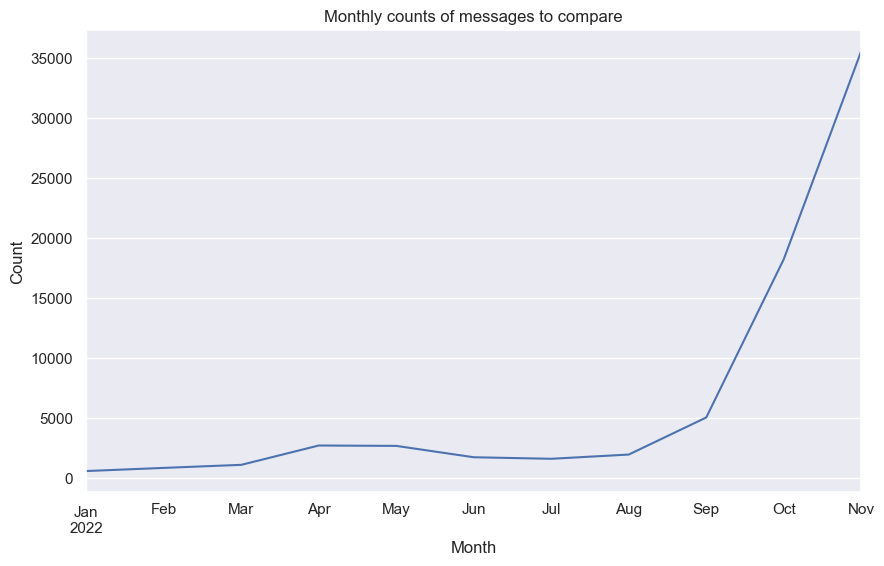

In [9]:
# plot monthly_counts
fig, ax = plt.subplots(figsize=(10, 6))
monthly_counts.plot(ax=ax)
ax.set_title('Monthly counts of messages to compare')
ax.set_xlabel('Month')
ax.set_ylabel('Count')
plt.show()


Como resultado se obtuvo un listado de 71997 pares a comparar. Es importante recalcar que son pocos los primeros meses y muchos más a partir de septiembre.

## Generate similarity matrix

### TFIDF approach

Ya con la lista de mensajes a comparar necesitamos generar las comparaciones entre estos.
Para esto necesitamos vertorizar los mensajes y luego calcular su similitud.

In [10]:
tfidf_vectorizer = TfidfVectorizer()
# tfidf_matrix = tfidf_vectorizer.fit_transform(df_sim['message_text_clean_utf8'])
tfidf_matrix = tfidf_vectorizer.fit_transform(df_sim['cleaned_sim'])


In [11]:
# Adicionamos una columna similarity a df_comp_src
df_comp_src = df_results
df_comp_src['similarity'] = get_similarities(df_comp_src, tfidf_matrix, df_sim)

In [12]:
df_comp_src.head(5)

,message_lbr,word_bin,trade_type,id_1,id_2,date_id_1,date_id_2,similarity
0,16,29,buy,9739,9488,2022-02-13 07:51:09+00:00,2022-02-18 17:37:22+00:00,0.707488
1,16,29,buy,980,9488,2022-02-14 14:08:01+00:00,2022-02-18 17:37:22+00:00,0.743101
2,16,29,buy,9830,9488,2022-02-14 17:56:40+00:00,2022-02-18 17:37:22+00:00,0.715444
3,16,29,buy,812,9488,2022-02-14 19:10:57+00:00,2022-02-18 17:37:22+00:00,0.683497
4,16,29,buy,9736,9488,2022-02-15 06:02:49+00:00,2022-02-18 17:37:22+00:00,0.750986


In [13]:
# Enriquecemos df_comp_src con las columnas de message_text_clean_utf8', 'cleaned_sim', 'chat_id', 'date_source_posted_at' 
# para los id_msg de df_comp_src
df_comp_src = enrich_chat_info(df_comp_src, df_sim)
df_comp_src = df_comp_src.sort_values(by='similarity', ascending=False)
df_comp_src.info()

<class 'pandas.core.frame.DataFrame'>
Index: 72016 entries, 15628 to 71921
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype              
---  ------                     --------------  -----              
 0   message_lbr                72016 non-null  int64              
 1   word_bin                   72016 non-null  int64              
 2   trade_type                 72016 non-null  object             
 3   id_1                       72016 non-null  int64              
 4   id_2                       72016 non-null  int64              
 5   similarity                 72016 non-null  float64            
 6   message_text_clean_utf8_1  72016 non-null  object             
 7   cleaned_sim_1              72016 non-null  object             
 8   chat_id_1                  72016 non-null  int64              
 9   date_id_1                  72016 non-null  datetime64[ns, UTC]
 10  message_text_clean_utf8_2  72016 non-null  object             
 11  cle

In [14]:
def print_pairs(df, n=10):
    # loop over df_comp_src and print the messages
    for idx, row in df_comp_flt.head(n).iterrows():
        print(f"similarity: {row['similarity']}")
        print(f"chat_id_1: {row['chat_id_1']}")
        print(f"chat_id_2: {row['chat_id_2']}")

        print(f"date_id_1: {row['date_id_1']}")
        print(f"date_id_2: {row['date_id_2']}")
        print("-" * 50*2)
        print("Message UTF8:")
        print("_" * 20)
        print_side_by_side(row['message_text_clean_utf8_1'], row['message_text_clean_utf8_2'], width=50, linebreak_symbol='↵')
        print("=" * 50*2)
        print("Message cleanned:")
        print("_" * 20)
        print_side_by_side(row['cleaned_sim_1'], row['cleaned_sim_2'], width=50, linebreak_symbol='↵')

        print("_" * 50*2)


flt_sim = (df_comp_src['similarity'] < 1) & (df_comp_src['similarity'] > 0.8)
df_comp_flt = df_comp_src[flt_sim]
print_pairs(df_comp_flt, n=5)



similarity: 0.9999999999999999
chat_id_1: 1751
chat_id_2: 1735
date_id_1: 2022-10-13 04:57:14+00:00
date_id_2: 2022-10-13 04:57:31+00:00
----------------------------------------------------------------------------------------------------
Message UTF8:
____________________
ocr:↵                                              | ocr:↵                                             
#qkc (binance) buy zone 51-55 sell zone            | #qkc (binance) buy zone 51-55 sell zone           
57-62-66-73+ by @crypto_pump_island (@apglobals)   | 57-62-66-73+ by @crypto_pump_island (@apglobals)  
Message cleanned:
____________________
ocr↵                                               | ocr↵                                              
qkc binance buy zone {NUM} {NUM} sell zone {NUM}   | qkc binance buy zone {NUM} {NUM} sell zone {NUM}  
{NUM} {NUM} {NUM} by @ crypto pump island @        | {NUM} {NUM} {NUM} by @ crypto pump island @       
apglobals                                          | apglobals  

In [15]:
flt_sim = (df_comp_src['similarity'] < 0.3) & (df_comp_src['similarity'] > 0)
df_comp_flt = df_comp_src[flt_sim]
print_pairs(df_comp_flt, n=10)

similarity: 0.2999450524194074
chat_id_1: 3
chat_id_2: 2131
date_id_1: 2022-04-05 20:59:40+00:00
date_id_2: 2022-04-10 12:18:20+00:00
----------------------------------------------------------------------------------------------------
Message UTF8:
____________________
#alpine/btc (binance)↵                             | #btc/usd↵                                         
buy zone: 14833-15224↵                             | exchanges: binance coin-futures↵                  
target 1: 15859↵                                   | signal type: regular (long)↵                      
target 2: 16270↵                                   | leverage: cross (50.0x)↵                          
target 3: 17256↵                                   | amount: 15.0%↵                                    
target 4: 18387↵                                   | entry zone: 42650 - 46400↵                        
target 5: 19928↵                                   | take-profit targets:↵                             
th

En los listados anteriores se puede ver pares de mesajes(texto en utf y texto limpio) junto con la similaridad y las fechas de ambos mensajes.

Tambien podemos verificar que los mensajes comparados estan cerca temporalmente y, cuando tienen similaridades altas son muy parecidos si no iguales mientras que con similaridad baja son bastante distintos en su estructura.

## Identificación de canales relacionados

### Clusters por grupos de mensajes

Vamos a intentar clusterizar mensajes por su similtud y en base a ese resultado ver que canales están relacionados
Consideraremos mensajes con una similitud mayor a 0.8
La clusterizacón se realizara por los mensajes asociados a cada grupo, de esta forma la clusterización se hace entre mensajes que comparten los mismos **message_lbr**, **word_bin**, **trade_type**.

In [16]:
# filter df_comp by similarity > 0.8
# flt = df_comp_src['similarity'] == 1
flt = df_comp_src['similarity'] > 0.8
df_comp = df_comp_src[flt]

In [17]:
clusters_affinity_propagation = gen_cluster(df_comp, 'AffinityPropagation')

message_lbr: 0, word_bin: 29, trade_type: buy, count: 1
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 0, word_bin: 29, trade_type: sell, count: 1
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 1, word_bin: 20, trade_type: buy, count: 43
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 1, word_bin: 22, trade_type: buy, count: 17
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 1, word_bin: 29, trade_type: buy, count: 355
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 2, word_bin: 13, trade_type: buy, count: 1
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 3, word_bin: 19, trade_type: buy, count: 9
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 4, word_bin: 14, trade_type: buy, count: 12
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 4, word_bin: 18, trade_type: buy, count: 2
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 4, word_bin: 21, trade_type: buy, count: 9
Id

/Users/jbaudoin/.pyenv/versions/3.10.14/envs/mentoria-3.10.14/lib/python3.10/site-packages/sklearn/cluster/_affinity_propagation.py:52: UserWarning: All samples have mutually equal similarities. Returning arbitrary cluster center(s).
  warnings.warn(
/Users/jbaudoin/.pyenv/versions/3.10.14/envs/mentoria-3.10.14/lib/python3.10/site-packages/sklearn/cluster/_affinity_propagation.py:52: UserWarning: All samples have mutually equal similarities. Returning arbitrary cluster center(s).
  warnings.warn(
/Users/jbaudoin/.pyenv/versions/3.10.14/envs/mentoria-3.10.14/lib/python3.10/site-packages/sklearn/cluster/_affinity_propagation.py:52: UserWarning: All samples have mutually equal similarities. Returning arbitrary cluster center(s).
  warnings.warn(
/Users/jbaudoin/.pyenv/versions/3.10.14/envs/mentoria-3.10.14/lib/python3.10/site-packages/sklearn/cluster/_affinity_propagation.py:52: UserWarning: All samples have mutually equal similarities. Returning arbitrary cluster center(s).
  warnings.wa

message_lbr: 10, word_bin: 28, trade_type: buy, count: 3
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 10, word_bin: 29, trade_type: buy, count: 56
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 11, word_bin: 29, trade_type: buy, count: 118
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 12, word_bin: 29, trade_type: buy, count: 18840
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 12, word_bin: 29, trade_type: sell, count: 1
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 13, word_bin: 29, trade_type: buy, count: 2
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 13, word_bin: 29, trade_type: sell, count: 1
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 14, word_bin: 29, trade_type: buy, count: 32
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 15, word_bin: 29, trade_type: sell, count: 2
Ids in ids_check not in df_comp: {11921, 10405}
message_lbr: 16, word_bin: 29, trade_type: s

/Users/jbaudoin/.pyenv/versions/3.10.14/envs/mentoria-3.10.14/lib/python3.10/site-packages/sklearn/cluster/_affinity_propagation.py:52: UserWarning: All samples have mutually equal similarities. Returning arbitrary cluster center(s).
  warnings.warn(
/Users/jbaudoin/.pyenv/versions/3.10.14/envs/mentoria-3.10.14/lib/python3.10/site-packages/sklearn/cluster/_affinity_propagation.py:52: UserWarning: All samples have mutually equal similarities. Returning arbitrary cluster center(s).
  warnings.warn(


In [18]:
# count the number of clusters in clusters_affinity_propagation
total = 0
for idx, cluster in enumerate(clusters_affinity_propagation):
    clusters_in_grp = len(cluster)
    print(f"grp {idx}: {clusters_in_grp}")
    total += clusters_in_grp
print(f"Total number of clusters: {total}")

grp 0: 1
grp 1: 1
grp 2: 4
grp 3: 2
grp 4: 2
grp 5: 1
grp 6: 5
grp 7: 2
grp 8: 1
grp 9: 2
grp 10: 1
grp 11: 6
grp 12: 1
grp 13: 1
grp 14: 15
grp 15: 3
grp 16: 1
grp 17: 1
grp 18: 1
grp 19: 7
grp 20: 6
grp 21: 13
grp 22: 1
grp 23: 1
grp 24: 1
grp 25: 2
grp 26: 1
grp 27: 2
grp 28: 5
grp 29: 1
Total number of clusters: 91


El proceso de busqueda de cluster encontro 91 en total, en algunos grupos se encontraron más de un cluster(15 el mayor) mientras que en la mayoria se encontraron 1 o dos clusters.

In [19]:
from itertools import chain

# Armar un DataFrame con los grupos de clusters
def gen_clusters_groups_df(clusters_groups):
    compare_list = []
    cluster_grp_id = -1
    cluster_count = 0
    print(f'Total number of groups: {len(clusters_groups)}')
    for cluster_grp in clusters_groups:
        cluster_grp_id += 1
        print(f'Total number of cluster in group {cluster_grp_id}: {len(cluster_grp)}')
        cluster_id = -1
        for cluster in cluster_grp:
            cluster_id += 1
            cluster_count += 1
            # combine the lists by pairs with no repetitions
            combs = set([frozenset([id1, id2]) for id2 in cluster for id1 in cluster if id1 != id2])
            # print(combs)
            for pair in combs:
                lpair = list(pair)
                compare_list.append({
                    'c_id': f'{cluster_grp_id}-{cluster_id}',
                    'c_grp': cluster_grp_id,
                    'sc_id': cluster_id,
                    'id_1': lpair[0], 'id_2': lpair[1]})
                # print(pair)
                # print(pair[0], pair[1])

        # generate a dataframe from compare_list
    clusters_compare_df = pd.DataFrame.from_dict(compare_list)
    print(f'Total number of clusters: {cluster_count}')
    return clusters_compare_df

In [20]:
clusters_compare_df = gen_clusters_groups_df(clusters_affinity_propagation)

Total number of groups: 30
Total number of cluster in group 0: 1
Total number of cluster in group 1: 1
Total number of cluster in group 2: 4
Total number of cluster in group 3: 2
Total number of cluster in group 4: 2
Total number of cluster in group 5: 1
Total number of cluster in group 6: 5
Total number of cluster in group 7: 2
Total number of cluster in group 8: 1
Total number of cluster in group 9: 2
Total number of cluster in group 10: 1
Total number of cluster in group 11: 6
Total number of cluster in group 12: 1
Total number of cluster in group 13: 1
Total number of cluster in group 14: 15
Total number of cluster in group 15: 3
Total number of cluster in group 16: 1
Total number of cluster in group 17: 1
Total number of cluster in group 18: 1
Total number of cluster in group 19: 7
Total number of cluster in group 20: 6
Total number of cluster in group 21: 13
Total number of cluster in group 22: 1
Total number of cluster in group 23: 1
Total number of cluster in group 24: 1
Total 

In [ ]:
clusters_compare_df.info()

In [21]:
clusters_compare_df = enrich_chat_info(clusters_compare_df, df_sim)



In [22]:
# Filter pairs form the same chat_id
flt = clusters_compare_df['chat_id_1'] != clusters_compare_df['chat_id_2']
clusters_compare_df = clusters_compare_df[flt]
# print number of rows in clusters_compare_df
print(f"Number of rows in clusters_compare_df: {clusters_compare_df.shape[0]}")

Number of rows in clusters_compare_df: 8991


In [23]:
clusters_similarities =  get_similarities(clusters_compare_df, tfidf_matrix, df_sim)

In [24]:
clusters_compare_df['similarity'] = clusters_similarities
# enrich the similarities
clusters_compare_df['distance'] = (1 - clusters_compare_df['similarity']).round(5)

In [25]:
clusters_compare_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8991 entries, 0 to 94010
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype              
---  ------                     --------------  -----              
 0   c_id                       8991 non-null   object             
 1   c_grp                      8991 non-null   int64              
 2   sc_id                      8991 non-null   int64              
 3   id_1                       8991 non-null   int64              
 4   id_2                       8991 non-null   int64              
 5   message_text_clean_utf8_1  8991 non-null   object             
 6   cleaned_sim_1              8991 non-null   object             
 7   chat_id_1                  8991 non-null   int64              
 8   date_id_1                  8991 non-null   datetime64[ns, UTC]
 9   message_text_clean_utf8_2  8991 non-null   object             
 10  cleaned_sim_2              8991 non-null   object             
 11  chat_id_

In [26]:
# add a column idx_chats with joining chat_id_1 and chat_id_2 with a - in a sorted order
clusters_compare_df.loc[:, 'idx_chats'] = clusters_compare_df.apply(lambda x: '-'.join(sorted([str(x['chat_id_1']), str(x['chat_id_2'])])), axis=1)


In [33]:
flt = clusters_compare_df['similarity'] > 0.8
clusters_compare_df = clusters_compare_df[flt]
print(f"Number of rows in clusters_compare_df: {clusters_compare_df.shape[0]}")

Number of rows in clusters_compare_df: 8668


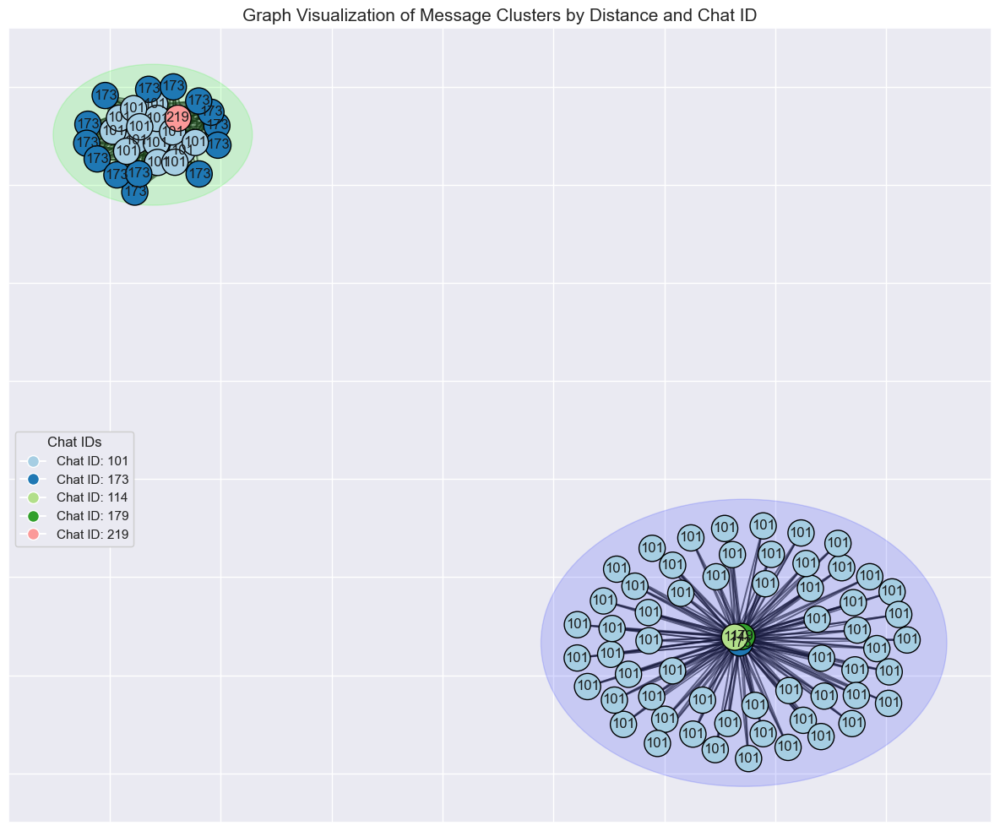

2

In [39]:
# count values of c_id
clusters_compare_df['c_id'].value_counts()
# get the list of c_id with more than 1 value and less than 10
flt = (clusters_compare_df['c_id'].value_counts() > 100) & (clusters_compare_df['c_id'].value_counts() < 250)
sub_grp = clusters_compare_df['c_id'].value_counts()[flt].head(15)

# filter clusters_compare_df by c_id in sub_grp
flt = clusters_compare_df['c_id'].isin(sub_grp.index)
test_clusters = clusters_compare_df[flt]
plot_clusters(test_clusters, 0.3)

# count the number of clusters intest_clusters
test_clusters['c_id'].nunique()


In [35]:
check_sim_clusters(test_clusters, [0,1])

 --- 21-4 ---
Similarity: 0.8839288241161076
_____________________________________________________________________________________________________
Chat ID: 101                                       | Chat ID: 173                                      
ccf↵                                               | ontusdt↵                                          
pair : lrcusdt↵                                    | long↵                                             
long↵                                              | entry: 0.1805-0.175085↵                           
leverage : cross 20x↵                              | leverage: cross 25x↵                              
entry : 0.2318 - 0.2216↵                           | target 1 - 0.1814025↵                             
target 1 : 0.23342↵                                | target 2 - 0.1832075↵                             
target 2 : 0.23713↵                                | target 3 - 0.1850125↵                             
target 3 : 0.23944↵  

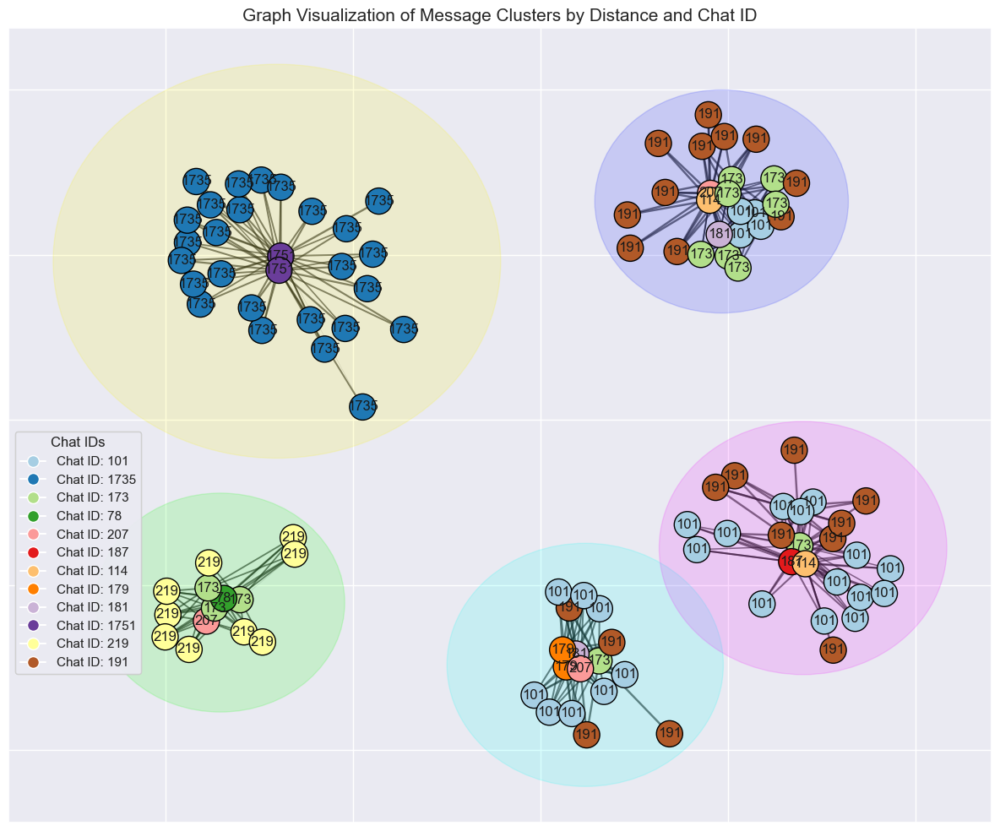

5

In [40]:
# get the list of c_id with more than 1 value and less than 10
flt = (clusters_compare_df['c_id'].value_counts() > 40) & (clusters_compare_df['c_id'].value_counts() < 100)
sub_grp = clusters_compare_df['c_id'].value_counts()[flt].head(15)

# filter clusters_compare_df by c_id in sub_grp
flt = clusters_compare_df['c_id'].isin(sub_grp.index)
test_clusters = clusters_compare_df[flt]

plot_clusters(test_clusters, 0.3)

# count the number of clusters intest_clusters
test_clusters['c_id'].nunique()

In [37]:
check_sim_clusters(test_clusters, [0,1])

 --- 20-1 ---
Similarity: 0.932779098960887
_____________________________________________________________________________________________________
Chat ID: 219                                       | Chat ID: 173                                      
#btcusdt↵                                          | #ethusdt↵                                         
short↵                                             | short↵                                            
leverage : cross 20x↵                              | leverage : cross 20x↵                             
entry : 16703.04 - 17204.1312↵                     | entry : 1209.81 - 1246.1043↵                      
target 1 : 16612.84358↵                            | target 1 : 1203.27702↵                            
target 2 : 16485.90048↵                            | target 2 : 1194.08247↵                            
target 3 : 16285.464↵                              | target 3 : 1179.56475↵                            
target 4 : 16168.54272

Como se pudo observar, la tecnica de clustering armo grupos de mensajes similares.
Es importante recalcar, que algunos cluster tienene una concentración de muchos mensajes relacionados con unos pocos y en otros las relaciones son más balanceadas.

## Canales relacionados

Con la información de los obtenida anteriormente calcularemos algunos valores respecto a los canales y con esta información estableceremos si hay relación entre ellos.

In [38]:
import pandas as pd

def channel_corr_metrics(df_comp_cluster):
    # filter df_comp where chat_id_1 == chat_id_2
    flt = df_comp_cluster['chat_id_1'] != df_comp_cluster['chat_id_2']
    df_comp_cluster = df_comp_cluster[flt].copy()

    # add a column id_low with the lower id between chat_id_1 and chat_id_2
    df_comp_cluster['id_low'] = df_comp_cluster.apply(lambda x: min(x['chat_id_1'], x['chat_id_2']), axis=1)
    # add a column id_low with the max id between chat_id_1 and chat_id_2
    df_comp_cluster['id_high'] = df_comp_cluster.apply(lambda x: max(x['chat_id_1'], x['chat_id_2']), axis=1)

    # get the number of messages group by id_low and id_high, also average and meadian distance and similarity and number of clusters(c_id)
    chats_data = df_comp_cluster.groupby(['id_low', 'id_high']).agg({
        # 'distance': ['mean', 'median', 'min', 'max'],
        'similarity': ['mean', 'median', 'min', 'max', 'sum'],
        'c_id': 'nunique',
        'id_1': 'count'
    }).reset_index()

    # rename the columns
    chats_data.columns = ['id_low', 'id_high',
                        # 'avg_distance', 'median_distance', 'min_distance', 'max_distance',
                          'avg_sim', 'median_sim', 'min_sim', 'max_sim', 'sum_sim', 
                          'num_clusters', 'num_messages']


    # group by id_low, id_high and c_id, get the avg and median of similarity and distance, also number of items
    cluster_data = df_comp_cluster.groupby(['id_low', 'id_high', 'c_id']).agg({
        # 'distance': ['mean', 'median'],
        'similarity': ['mean', 'median'],
        'c_id': 'count'
    }).reset_index()

    # rename the columns
    cluster_data.columns = ['id_low', 'id_high', 'c_id', 
                            'avg_sim', 'median_sim',
                            'cluster_size']

    
    # group cluster_data by id_low and id_high and get the avg and median of the cluster_size
    cluster_size_data = cluster_data.groupby(['id_low', 'id_high']).agg({
        'cluster_size': ['mean', 'median'],
        'avg_sim': ['mean'],
        'median_sim': ['mean'],
    }).reset_index()

    # rename the columns

    cluster_size_data.columns = ['id_low', 'id_high', 
                                 'avg_cluster_size', 'median_cluster_size', 
                                 'avg_cl_avg_sim', 'avg_cl_median_sim']

    # merge chats_data with cluster_size_data
    channel_corr_data = pd.merge(chats_data, cluster_size_data, on=['id_low', 'id_high'], how='left')

    # sort by num_messages
    channel_corr_data = channel_corr_data.sort_values(by='num_messages', ascending=False)
    
    return channel_corr_data
    # return chats_data


# Example usage with the given df_comp DataFrame
channel_correlation_data = channel_corr_metrics(clusters_compare_df)






In [39]:
channel_correlation_data = channel_correlation_data.sort_values(by='sum_sim', ascending=False)
# channel_correlation_data.head(30).tail(20)
channel_correlation_data.head(10).tail(20)[['id_low','id_high', 'num_messages', 'sum_sim', 'median_sim']]

,id_low,id_high,num_messages,sum_sim,median_sim
14,101,173,3917,3472.988040,0.885175
21,101,219,1845,1617.254648,0.875236
3,78,101,582,501.024259,0.857485
15,101,179,445,393.353549,0.885006
19,101,207,377,316.958001,0.835198
12,101,114,278,249.458815,0.896087
17,101,187,242,215.865202,0.891214
35,173,187,80,72.198471,0.903580
40,173,219,67,62.131798,0.920055
22,114,173,46,42.770673,0.930863


Veamos como se en un grafo esta informacón.

[5.0, 2.986184159998995, 0.9215456983616421, 0.3556034351996084, 0.31205696123813664, 0.22790342272120517, 0.09082161987621881, 0.02929379337727652, 0.01876577645573439, 0.012886468745326564, 0.0017244297138941799, 0.12726316426106515, 0.0727239399718571, 0.060568423638454875, 0.057362888903759957, 0.05302837047338923, 0.0491824710922243, 0.03686698630173666, 0.024338479392184087, 0.0168378080040624, 0.011720084372504998, 0.0039614468263828185, 0.022910418296960215, 0.007825173074560961, 0.00610065834767041, 0.005573638725854805, 0.001978702356686912, 0.001965490797101935, 0.001740118564706638, 0.0039059649973829475, 0.0036773049622563225, 0.0035022656106059053, 0.001890416140610612, 0.001828293191848511, 0.001803089012310691, 0.0039012821605791934, 0.0017198389670550537, 0.011919462812843944, 0.009425377477735085, 0.006487976659526617, 0.0038781346495875817, 0.001975871509005264, 0.0017167249295010143, 0.0042917548511452455, 0.0034581510415284174, 0.0020060489594433, 0.001991281926353

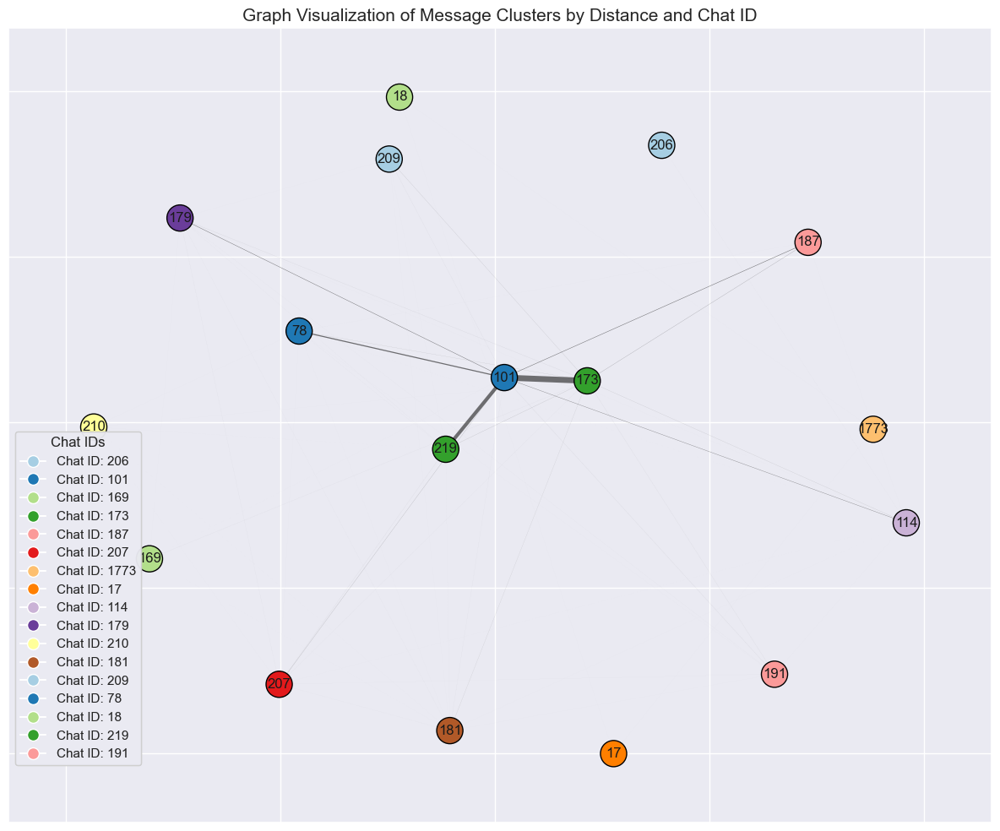

In [45]:
clusters_compare_df['idx_chats'] = clusters_compare_df['idx_chats']

chat_rel_metrics = gen_chat_pair_metrics(clusters_compare_df)

plot_chat_pair_metrics(chat_rel_metrics, k=0.5)


Se puede apreciar que hay varios canales que se relacionan entre si, siendo el canal 101, el que mantiene relaciones fuertos con otros, en segundo lugar podríamos colocalr al 173, que es el que se relaciona más con el 101 y adicionalmente mantiene relaciones con otros canales.

In [42]:
check_sim_chats(clusters_compare_df, 101, 173, width=50)

 --- 21-0 ---
Similarity: 0.8944385520890682
_____________________________________________________________________________________________________
Chat ID: 173                                       | Chat ID: 101                                      
Msg ID: 4201 - Fecha: 2022-10-07 21:01:58+00:00    | Msg ID: 2999 - Fecha: 2022-10-10 01:42:18+00:00   
-----------------------------------------------------------------------------------------------------
chzusdt↵                                           | ccf↵                                              
long↵                                              | pair : ethusdt↵                                   
entry: 0.2189-0.212333↵                            | long↵                                             
leverage: cross 25x↵                               | leverage : cross 20x↵                             
target 1 - 0.2199945↵                              | entry : 1333.47 - 1293.46589↵                     
target 2 - 0.2221835↵  

Como podemos ver en el listado anterior, los mensajes entre ambos canales mantienen una estructura muy parecida.

### Agrupación por metricas de chats

Otra alternativa para el analisis, es realizar el calculo de metricas a nivel de chats, partiendo de la lista de comparación de mensajes sin necesidad de hacer el clustering. 
Para este analisis tomaremos como base una similitud mayor a 0.9. Queremos trabajar con mensajes muy parecidos.

In [45]:
df_comp_src 
flt = df_comp_src['similarity'] > 0.90
df_comp_chat_metrics = df_comp_src[flt].copy()
# print the number of rows in df_comp_chat_metrics
print(f"Number of rows in df_comp_chat_metrics: {df_comp_chat_metrics.shape[0]}")

Number of rows in df_comp_chat_metrics: 1647


In [46]:
# Add a column with datetime difference in hours
df_comp_chat_metrics['date_id_1'] = pd.to_datetime(df_comp_chat_metrics['date_id_1'])
df_comp_chat_metrics['date_id_2'] = pd.to_datetime(df_comp_chat_metrics['date_id_2'])
df_comp_chat_metrics['date_diff'] = df_comp_chat_metrics['date_id_2'] - df_comp_chat_metrics['date_id_1']
df_comp_chat_metrics['date_diff_hours'] = df_comp_chat_metrics['date_diff'].dt.total_seconds() / 3600

# add a column with date_id_1 rounded to the nearest hour
df_comp_chat_metrics['date_id_1_round'] = df_comp_chat_metrics['date_id_1'].dt.round('h')


In [50]:
df_comp_chat_metrics['idx_chats']  = df_comp_chat_metrics.apply(lambda x: '-'.join(sorted([str(x['chat_id_1']), str(x['chat_id_2'])])), axis=1)

# add distance column
df_comp_chat_metrics['distance'] = (1 - df_comp_chat_metrics['similarity']).round(5)

In [52]:
chat_rel_metrics = gen_chat_pair_metrics(df_comp_chat_metrics)
flt = chat_rel_metrics['sim_ratio'] > 2
chat_rel_metrics[flt].sort_values(by='sim_ratio_norm', ascending=False)

,idx_chats,num_messages_pairs,msgs_chat_id_1,msgs_chat_id_2,sum_similarity,avg_similarity,sum_distance,avg_distance,msg_ratio,sim_ratio,sim_ratio_norm,chat_id_low,chat_id_high
1,101-173,517,186,211,472.646811,0.914210,44.35271,0.085789,1.134409,416.646004,1.000000,101,173
24,1730-1934,116,59,64,109.864792,0.947110,6.13519,0.052890,1.084746,101.281606,0.243088,1730,1934
23,173-219,138,43,34,128.061956,0.927985,9.93808,0.072015,1.264706,101.258291,0.243032,173,219
0,101-114,143,84,65,129.932744,0.908621,13.06726,0.091379,1.292308,100.543195,0.241316,101,114
7,114-173,98,51,46,91.354704,0.932191,6.64533,0.067809,1.108696,82.398360,0.197766,114,173
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34,179-207,5,4,5,4.728893,0.945779,0.27111,0.054222,1.250000,3.783114,0.009080,179,207
3,101-181,4,3,3,3.713726,0.928431,0.28626,0.071565,1.000000,3.713726,0.008913,101,181
38,181-209,4,2,2,3.686784,0.921696,0.31321,0.078302,1.000000,3.686784,0.008849,181,209
56,3689-3703,3,3,3,3.000000,1.000000,0.00000,0.000000,1.000000,3.000000,0.007200,3689,3703


La metrica que usamos para determinar el nivel de colaboración es sim_ratio_norm, que a su vez es la normalización de sim_ratio.

La metrica sim_ratio se define de la siguiente forma, para cada para de chat ids en el dataframe de comparaciones:
- Calcular:
  * Suma de similitudes
  * Numero de mensajes en chat_id_1, chat_id_2
  * ratio de numero de mensajes
- sim_ratio: Sum Similitudes/ratio mensajes

Esta metrica busca reflejar dos cosas:
- Mientras más mensajes hay entre dos chats, mayor relacion.
- Si la similitud es alta mayor relacion, por eso es la suma de similtud y no la de mensajes
- Se penaliza la concentración de mensajes relacionados, si muchos mensajes se relacionan con pocos, entoces baja la calidad de la relacion. Por eso se divide por el ratio de mensajes.


Veamos como se ven los mensajes entre los chats id 101-173.

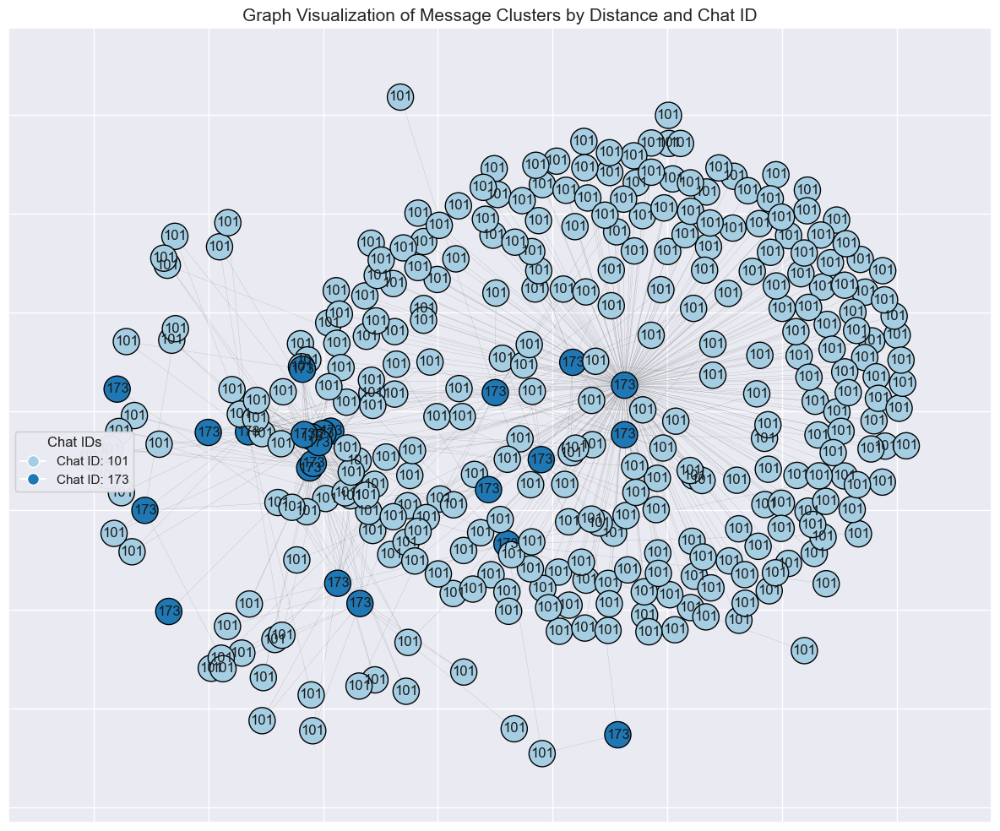

In [57]:
# df_comp_grouped_flt = df_comp_grouped[df_comp_grouped['num_messages_pairs'] >= 100]
flt = (chat_rel_metrics['idx_chats'] == '101-173')
df_comp_grouped_flt = chat_rel_metrics[flt]

#filter df_comp_chat_metrics_flt where chat_id_1  and chat_id_2 are in df_comp_grouped2 id_low and id_high
flt =       (df_comp_chat_metrics['chat_id_1'].isin(df_comp_grouped_flt['chat_id_low'])  & df_comp_chat_metrics['chat_id_2'].isin(df_comp_grouped_flt['chat_id_high']))
flt = flt | (df_comp_chat_metrics['chat_id_1'].isin(df_comp_grouped_flt['chat_id_high']) & df_comp_chat_metrics['chat_id_2'].isin(df_comp_grouped_flt['chat_id_low']))

df_comp_chat_metrics_flt = df_comp_chat_metrics[flt]

plot_msg_pairs(df_comp_chat_metrics_flt, k=0.15)

In [53]:
check_sim_chats(df_comp_chat_metrics, 101, 173, width=50, records=10, offset=0)

Similarity: 0.9604574273515849
_____________________________________________________________________________________________________
Chat ID: 101                                       | Chat ID: 173                                      
Msg ID: 2293 - Fecha: 2022-11-16 12:15:05+00:00    | Msg ID: 7015 - Fecha: 2022-11-19 19:00:24+00:00   
-----------------------------------------------------------------------------------------------------
ccf↵                                               | maskusdt↵                                         
pair : maskusdt↵                                   | short↵                                            
short↵                                             | entry: 2.883-2.96949↵                             
leverage : cross 20x↵                              | leverage: cross 25x↵                              
entry : 3.163 - 3.25789↵                           | target 1 - 2.868585↵                              
target 1 : 3.14591↵                  

El grafico, evidentemente muestra las relaciones y en el listado podemos constatar que los mensajes son muy parecidos.

Ahora veamos como se el grafo a nivel de metricas de chats.

[5.0, 1.2065781716142883, 0.3258688120127689, 0.23659768981599483, 0.09096758175870863, 0.05567697001762962, 0.04456692147536469, 1.215159748488202, 0.9888293574270819, 0.7522273980012267, 0.5093836779770835, 0.46944091921468567, 0.3835544898532423, 0.07273928166650567, 0.022140657034208457, 1.2154395406032101, 0.07832514468694213, 0.07339173360010541, 0.049137952489701174, 0.02233785838941006, 0.011114074630946042, 0.07479647558600458, 0.02193181733931727, 0.012000595118921962, 0.011818821902708323, 0.01113603595481437, 0.011050290787694005, 0.8363242975202573, 0.012000595118921962, 0.06000297559460983, 0.012000595118921962, 0.04963531938224477, 0.045399620049508295, 0.011230056101479572, 0.04424359920146514, 0.010959680187187976, 0.010941950541887836, 0.01090663367253971, 0.11650881349613074, 0.011230056101479572, 0.26224334518617576, 0.022191382199830773, 0.011772321992077815, 0.09831140409811692, 0.04800238047568785, 0.03600178535676589, 0.024001190237843924, 0.024001190237843924, 

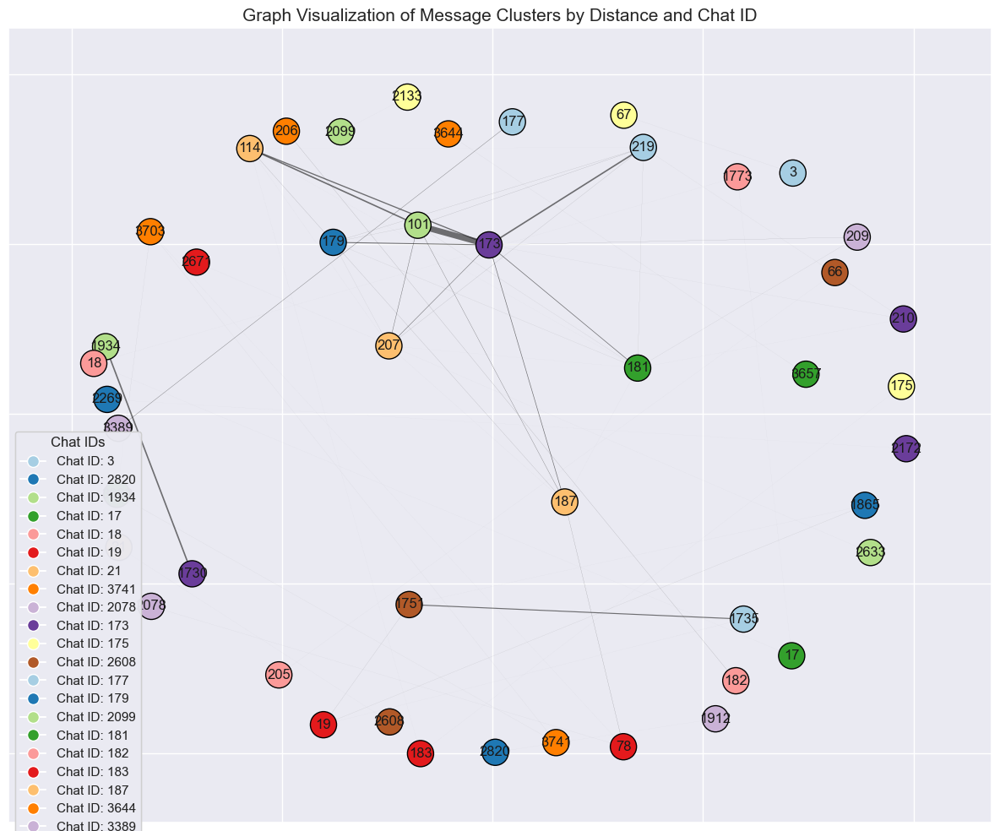

In [58]:
plot_chat_pair_metrics(chat_rel_metrics, k=0.5)

Es mucho más interesante y se pueden apreciar las relaciones entre varios canales.

In [63]:
def add_user_info(chat_rel_metrics, chat_id_title):
    # Merge chat_id_title with chat_rel_metrics to add telegram_user_id and title for chat_id_low
    chat_rel_metrics = chat_rel_metrics.merge(chat_id_title, left_on='chat_id_low', right_on='chat_id', how='left')
    chat_rel_metrics = chat_rel_metrics.rename(columns={'telegram_user_id': 'telegram_user_id_low', 'title': 'title_low'})
    chat_rel_metrics = chat_rel_metrics.drop(columns=['chat_id'])

    # Merge chat_id_title with chat_rel_metrics to add telegram_user_id and title for chat_id_high
    chat_rel_metrics = chat_rel_metrics.merge(chat_id_title, left_on='chat_id_high', right_on='chat_id', how='left')
    chat_rel_metrics = chat_rel_metrics.rename(columns={'telegram_user_id': 'telegram_user_id_high', 'title': 'title_high'})
    chat_rel_metrics = chat_rel_metrics.drop(columns=['chat_id'])

    return chat_rel_metrics

# Apply the function to chat_rel_metrics
chat_rel_metrics2 = add_user_info(chat_rel_metrics, chat_id_title)

In [65]:
cols = ['idx_chats', 'telegram_user_id_low', 'title_low', 'telegram_user_id_high', 'title_high', 'sim_ratio', 'num_messages_pairs', 'avg_similarity']
chat_rel_metrics2[cols].sort_values(by='sim_ratio', ascending=False).head(20).tail(10)



,idx_chats,telegram_user_id_low,title_low,telegram_user_id_high,title_high,sim_ratio,num_messages_pairs,avg_similarity
10,101-207,CryptoCashFlowReal,Crypto Cash flow,NaN,Cryptotegic™,27.154388,30,0.905146
11,177-3389,cryptofameo,LINA AND MANO TRADING 🦾,BingXOfficial,BingX - Empowering Traders,21.852528,25,0.941340
12,101-187,CryptoCashFlowReal,Crypto Cash flow,kryptocalls,KRYPTO CALLS 🧿,19.715496,28,0.905303
13,187-78,kryptocalls,KRYPTO CALLS 🧿,NaN,Crypto Devil® [ Private 🔒],9.708586,15,0.906135
14,182-206,NaN,Binance Team® - By Jhonny,Gtrading7,GLOBAL TRADING 🌍🌍,8.192211,11,0.930933
15,101-219,CryptoCashFlowReal,Crypto Cash flow,Zignaly00,Zignaly Crypto Signals ®,7.580256,25,0.952946
16,207-219,NaN,Cryptotegic™,Zignaly00,Zignaly Crypto Signals ®,6.526772,13,0.920442
17,114-187,makkaugatalgold1,MARC GOLD CARTEL 👑,kryptocalls,KRYPTO CALLS 🧿,6.232731,8,0.908940
18,179-219,Bitgetsignals0,BITGET SIGNALS,Zignaly00,Zignaly Crypto Signals ®,6.115675,16,0.917351
19,173-209,Bitstamp_1,BITSTAMP SIGNALS ®️,cryptocores,𝑪𝒓𝒚𝒑𝒕𝒐𝒄𝒐𝒓𝒆 𝒔𝒊𝒈𝒏𝒂𝒍𝒔,6.061306,22,0.918380


In [66]:
check_sim_chats(df_comp_chat_metrics, 177, 3389, width=50)

Similarity: 1.0
_____________________________________________________________________________________________________
Chat ID: 3389                                      | Chat ID: 177                                      
Msg ID: 9137 - Fecha: 2022-10-23 08:01:20+00:00    | Msg ID: 1318 - Fecha: 2022-10-23 08:01:20+00:00   
-----------------------------------------------------------------------------------------------------
dot/usdt↵                                          | dot/usdt↵                                         
exchange: binance future,kucoin,bybit usdt↵        | exchange: binance future,kucoin,bybit usdt↵       
leverage: cross (20.0x)↵                           | leverage: cross (20.0x)↵                          
entry:   6.04-6.12↵                                | entry:   6.04-6.12↵                               
target 1: 6.0098↵                                  | target 1: 6.0098↵                                 
target 2: 5.9796↵                                  |

# Muestras de chats con similitud

In [41]:
# get the unique values of chat_id and title
chat_id_title = df_sim[['chat_id', 'telegram_user_id', 'title']].drop_duplicates()
chat_id_title

,chat_id,telegram_user_id,title
0,3,crypto_signals_binance_pump,Crypto PUMP signals for Binance 🚀
208,4,CryptoPumpisland_Official,Crypto pump island (Backup 1)
216,5,bitcoinpumpgroup,Bitcoin Pump Group
1348,8,cryptopapa_signalsadmin1,Crypto Papa Signals
1386,9,NaN,premium binance signals turkey
...,...,...,...
10466,3741,BybitAfrica,Bybit Africa
10515,3745,BybitItalian,Bybit Italiano
10524,3846,NaN,Glass Ceiling🏴‍☠️⌨️
10525,3872,avalanche_zh,Avalanche(AVAX)官方中文群


Casos con varios mensajes identicos

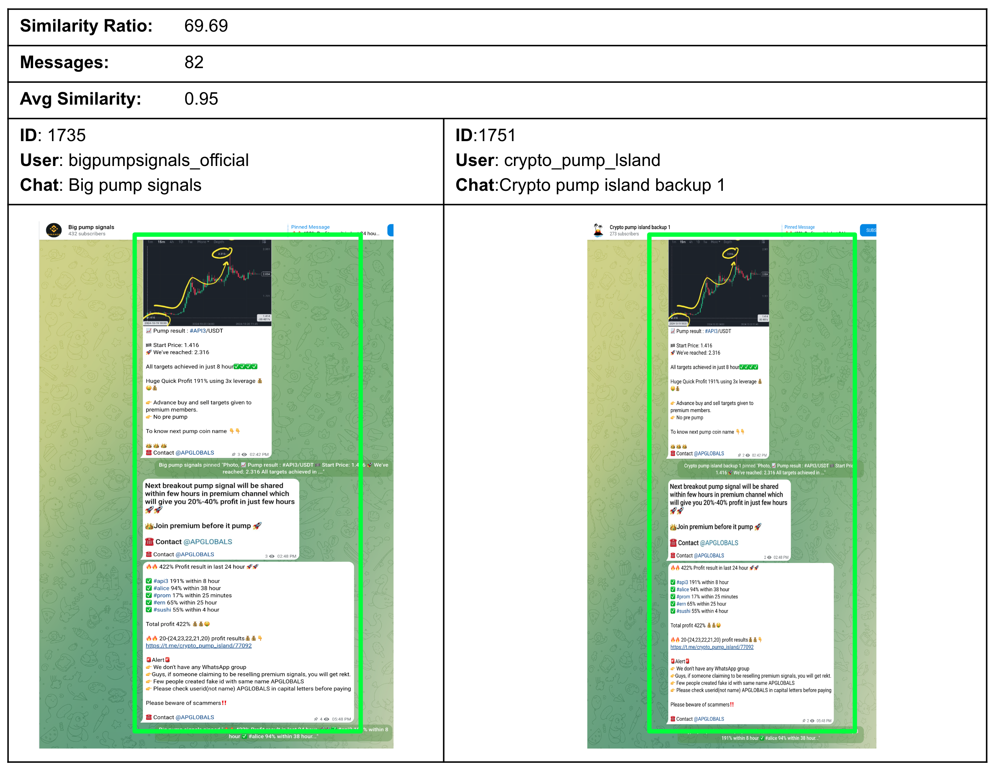

Con algunos mensajes iguales

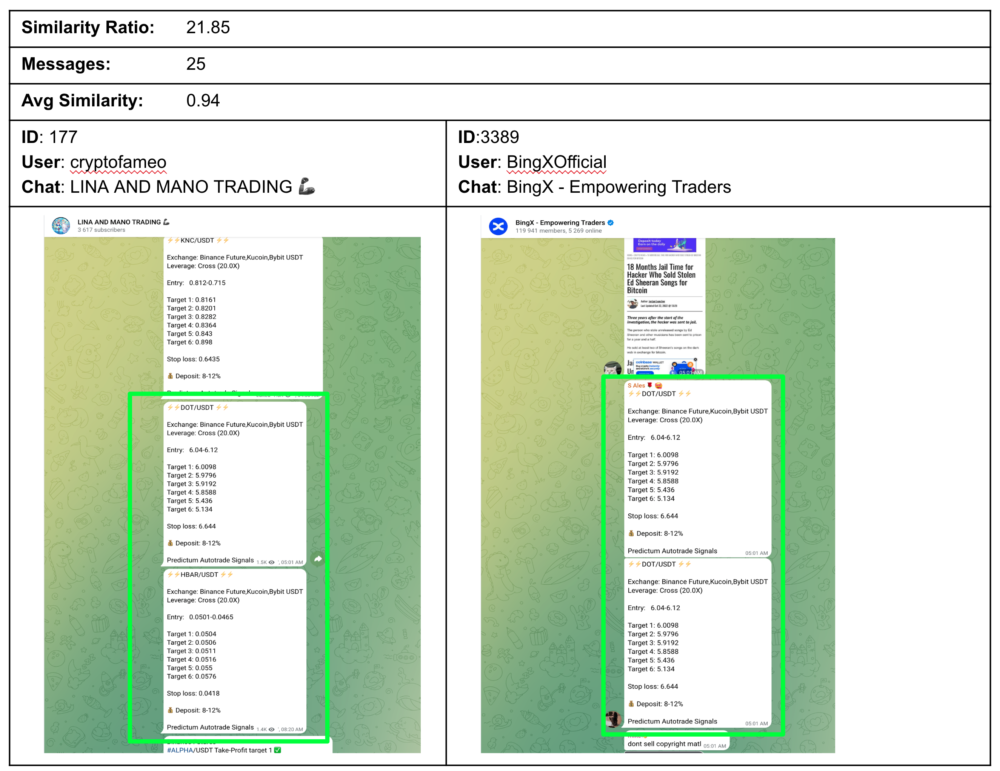

Canales con mensajes similares en estructura

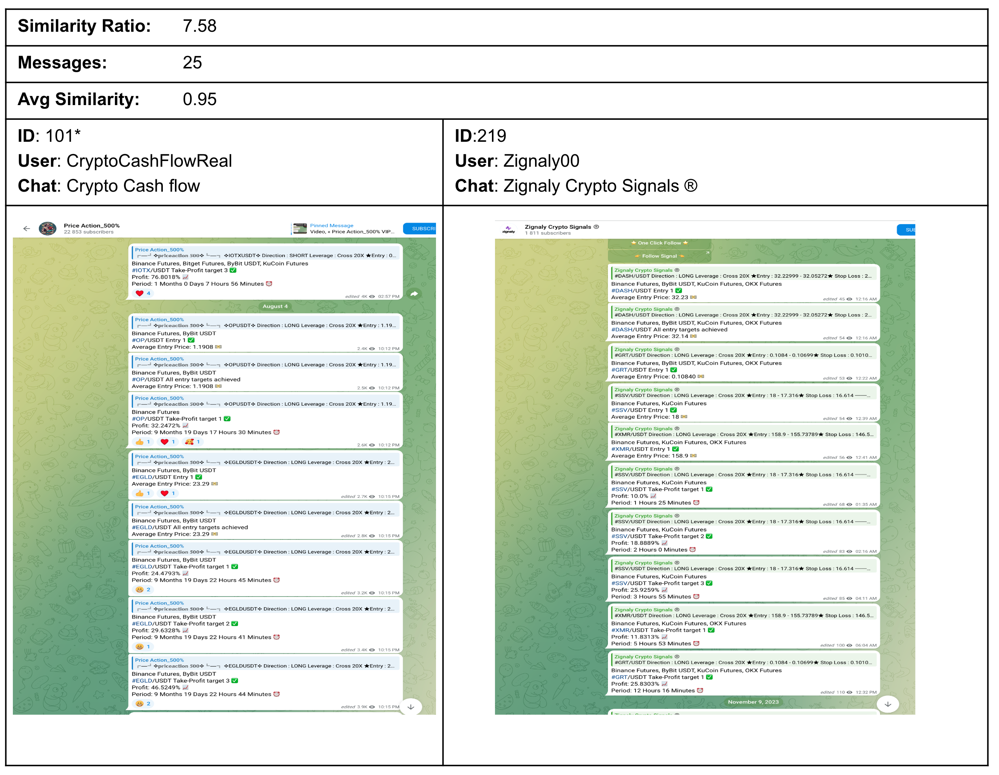

* En este caso el canal **Crypto Cash flow** redirecciona a otro canal.

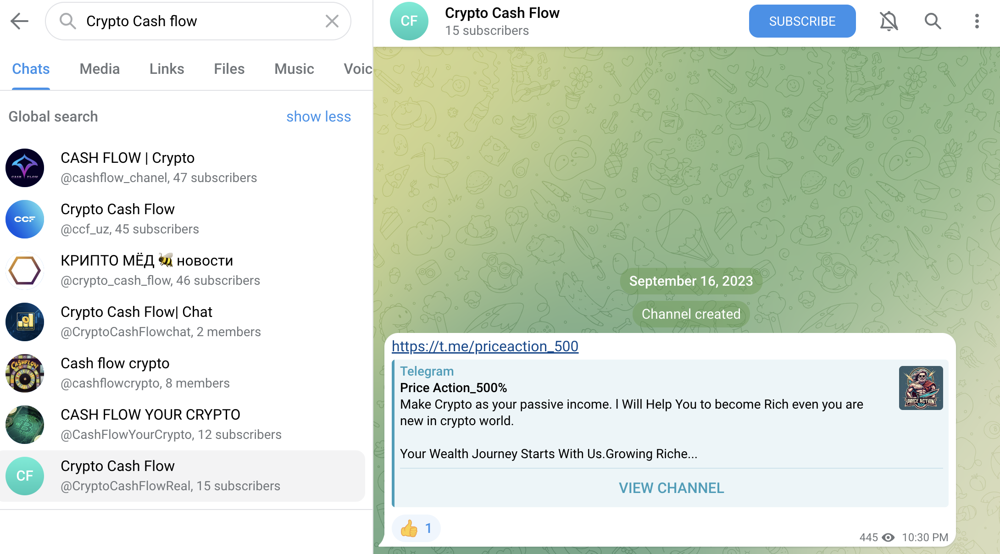

# Conclusiones

De este trabajo se encontraron varios aprendizajes:
- El proceso de limpieza es complejo y muy demandante. 
 * Variabilidad de los mensajes
 * Cantidad de mensajes basura
 * Extracción de datos de valor, problemas de falsos positivos en la detección de monedas y trade_types
 * Manejo de los idiomas, todas las tecnicas de parseo y tokenización se basan en el idioma.
- En este tipo de trabajo, el proceso de extracción y limpieza previo es clave para este tipo de analisis.
- Trabajar con la muestra de datos grande fue muy complicado y tencnicas que funcionanron en grupos de datos pequeños no escalan para cantidades muy grandes.
    - Paralelización de procesamiento es requerida
    - Estrategias de optimización y control de despercicio son necesaria:
        - Trabajo por chuchks de datos en paralelo
        - Uso de ventanas de comparación
        - Comparación por grupos de mensajes

Resultados:
* Respeto a los resultados por los dos metodos, se ven coincidencias en varios de los chats más relacionados.
*  Vemos que las relaciones que obtenemos por el metodo de las metricas son mas interesantes y este es un metodo más simple, por lo que lo utilizariamos.
* Vemos como muy util el uso de LLM en la parte de extración y parsing de mensajes, esto puede ser de utilidad para establecer relaciones más fuerte por contenido y no por estrucutura del mensaje.